# 非正規母集団でのWelchのt検定

* 黒木玄
* 2025-02-04
$
\newcommand\op{\operatorname}
\newcommand\var{\op{var}}
\newcommand\cov{\op{cov}}
$

In [1]:
using Distributions
using HypothesisTests
using QuadGK
using Random
using StatsPlots
default(fmt=:png, legendfontsize=11)
using SymPy

In [2]:
module O

using Distributions
using QuadGK

struct ConvolPosDist{D1,D2} <: ContinuousUnivariateDistribution
    dist1::D1
    dist2::D2
end

function Distributions.pdf(dist::ConvolPosDist, x::Real)
    (; dist1, dist2) = dist
    f(t) = pdf(dist1, t) * pdf(dist2, x-t)
    quadgk(f, 0, x)[1]
end

end

function dist_S²(sx², sy², m, n)
    dist1 = sx² / (m*(m-1)) * Chisq(m-1)
    dist2 = sy² / (n*(n-1)) * Chisq(n-1)
    O.ConvolPosDist(dist1, dist2)
end

function a_nu_welch(sx², sy², m, n)
    ES² = sx²/m + sy²/n
    halfvarS² = (sx²)^2/(m^2*(m-1)) + (sy²)^2/(n^2*(n-1))
    a = halfvarS² / ES²
    nu = (ES²)^2 / halfvarS²
    (; a, nu, ES², halfvarS²)
end

function approx_dist_S²(sx², sy², m, n)
    (; a, nu) = a_nu_welch(sx², sy², m, n)
    a * Chisq(nu)
end

approx_dist_S² (generic function with 1 method)

In [3]:
distname(dist) = replace(string(dist), r"{[^}]*}"=>"")

_ecdf(A, x) = count(≤(x), A) / length(A)

function pvals(; distx=Normal(0, 2), disty=Normal(0, 1), m=50, n=100, niters=10^5)
    pval_student = zeros(niters)
    pval_welch = zeros(niters)
    nth = Threads.nthreads()
    Xtmp = [zeros(m) for _ in 1:nth]
    Ytmp = [zeros(n) for _ in 1:nth]
    Threads.@threads :static for i in 1:niters
        tid = Threads.threadid()
        X = rand!(distx, Xtmp[tid])
        Y = rand!(disty, Ytmp[tid])
        pval_student[i] = pvalue(EqualVarianceTTest(X, Y))
        pval_welch[i] = pvalue(UnequalVarianceTTest(X, Y))
    end
    (; pval_student, pval_welch)
end

function plot_pvals(; 
        distx = Normal(0, 2),
        disty = Normal(0, 1),
        niters = 10^5,
        k = 1,
    )
    PP = []
    for l in 2:7
        m = k*l
        n = k*(10 - l)
        (; pval_student, pval_welch) = pvals(; distx, disty, m, n, niters)
        P = plot(α -> _ecdf(pval_welch, α), 0, 0.1; label="Welch")
        plot!(α -> _ecdf(pval_student, α), 0, 0.1; label="Student", ls=:dash)
        plot!(identity; label="", ls=:dot, c=:black, aloha=0.5)
        plot!(xtick=0:0.01:1, ytick=0:0.01:1, xrotation=90)
        plot!(xguide="α", yguide="probability of P-value ≤ α")
        title!("m = $m,  n = $n")
        push!(PP, P)
    end
    
    plot(PP...; size=(800, 1280), layout=(3, 2))
    plot!(plot_title="distx = $(distname(distx)),  disty = $(distname(disty))",
        plot_titlefontsize=14)
    plot!(leftmargin=8Plots.mm)
end

plot_pvals (generic function with 1 method)

In [18]:
function winning_rate(distx::UnivariateDistribution, disty::ContinuousUnivariateDistribution)
    f(y) = cdf(distx, y) * pdf(disty, y)
    quadgk(f, extrema(disty)...)[1]
end

function fair_handicap_shift(distx::UnivariateDistribution, disty::ContinuousUnivariateDistribution; p=1/2)
    f(s) = winning_rate(distx + s, disty) - p
    find_zero(f, 0.0)
end

function fair_handicap_multiple(distx::UnivariateDistribution, disty::ContinuousUnivariateDistribution; p=1/2)
    f(m) = winning_rate(m * distx, disty) - p
    find_zero(f, 1.0)
end

distx, disty = Gamma(1, 3), Normal(10, 1)
@show fhs = fair_handicap_shift(distx, disty)
@show winning_rate(distx + fhs, disty)
plot(distx + fhs, 5, 25; label="distx + fhs")
plot!(disty; label="disty") |> display

distx, disty = Gamma(1, 3), Normal(5, 2)
@show fhm = fair_handicap_multiple(distx, disty)
@show winning_rate(fhm * distx, disty)
plot(fhm * distx, -2, 40; label="fhm * distx")
plot!(disty; label="disty") |> display

## 2標本に関する一般的な設定

以下, 確率変数$X_1,\ldots,X_m,Y_1,\ldots,Y_n$は独立であり, $X_i$たちは同分布で, $Y_j$たちも同分布であるとし,  
\begin{align*}
&
\bar X = \frac1m \sum_{i=1}^m X_i, \quad S^2_X = \frac1{m-1}\sum_{i=1}^m (X_i-\bar X)^2,
\\ &
\bar Y = \frac1m \sum_{j=1}^n Y_j, \quad S^2_Y = \frac1{n-1}\sum_{j=1}^n (Y_j-\bar Y)^2
\end{align*}
とおく. $X_i$の期待値, 標準偏差, 歪度, (過剰)尖度をそれぞれ$\mu_X,\sigma_X,\bar\kappa_{3,X},\bar\kappa_{4,X}$と書き, $Y_j$の期待値, 標準偏差, 歪度(わいど, skewness), (過剰)尖度(せんど, kurtosis)をそれぞれ$\mu_Y,\sigma_Y,\bar\kappa_{3,Y},\bar\kappa_{4,Y}$と書く.

歪度と(過剰)尖度の定義は次の通り:
$$
\bar\kappa_{3,X} = E\left[\left(\frac{X_i-\mu_X}{\sigma_X}\right)^3\right],
\quad
\bar\kappa_{4,X} = E\left[\left(\frac{X_i-\mu_X}{\sigma_X}\right)^4\right] - 3.
$$
これは次と同値である:
$$
\log E\left[\exp\left(t\left(\frac{X_i-\mu_X}{\sigma_X}\right)\right)\right]
= \frac{t^2}{2} + \bar\kappa_{3,X} \frac{t^3}{3!} + \bar\kappa_{4,X} \frac{t^4}{4!} + O(t^5).
$$
もしも$X_i$が正規分布に従っているならば, その歪度と尖度はゼロになる: $\bar\kappa_{3,X}=\bar\kappa_{4,X}=0$.
歪度と尖度は不等式
$$
\bar\kappa_{4,X} \ge \bar\kappa_{3,X}^2 - 2
$$
を満たしており, 尖度は成功率$1/2$のBernoulli分布で最小の$-2$になる.

__定理:__ 標本平均$\bar X$と不偏分散$S^2_X$の期待値と分散と共分散は以下のようになる:
\begin{align*}
&
E[\bar X]=\mu_X, \quad
E[S^2_X]=\sigma^2_X, 
\\ &
\var(\bar X) = \frac{\sigma^2_X}{m}, \quad
\cov(\bar X, S^2_X) = \sigma^3_X \frac{\bar\kappa_{3 ,X}}{m}, \quad
\var(S^2_X) = \sigma^4_X \left( \frac{\bar\kappa_{4,X}}{m} + \frac{2}{m-1} \right).
\end{align*}

## 正規母集団の仮定の下でのWelchのt検定導出の仕組み

この節では$X_i$と$Y_j$は正規分布に従っていると仮定する. このとき以下が成立する:

(1) $\bar X,S^2_X,\bar Y, S^2_Y$は独立である.

(2) $\bar X$は期待値$\mu_X$と分散$\sigma^2_X/m$を持つ正規分布に従い, $\bar Y$は期待値$\mu_Y$と分散$\sigma^2_Y/n$を持つ正規分布に従う.
ゆえに, $\Delta\mu=\bar X-\bar Y$は期待値$\mu_X-\mu_Y$と分散$\dfrac{\sigma^2_X}{m}+\dfrac{\sigma^2_Y}{n}$を持つ正規分布に従う.

(3) $(m-1)S^2_X/\sigma^2_X$は自由度$m-1$の$\chi^2$分布に従い, $(n-1)S^2_Y/\sigma^2_Y$は自由度$n-1$の$\chi^2$分布に従う. (自由度$\nu$の$\chi^2$分布の期待値と分散はそれぞれ$\nu$と$2\nu$である.)

上の(2)より, 次の$Z$は標準正規分布に従う:
\begin{align*}
Z = \frac{\bar X-\bar Y-\Delta\mu}{\sqrt{\dfrac{\sigma^2_X}{m}+\dfrac{\sigma^2_Y}{n}}}.
\end{align*}

さらに(3)より,
\begin{align*}
S^2 = \frac{S^2_X}{m}+\frac{S^2_Y}{n}
\end{align*}
について,
\begin{align*}
E[S^2]=\frac{\sigma^2_X}{m}+\frac{\sigma^2_Y}{n}, \quad
\frac12\var(S^2)=\frac{\sigma^4_X}{m^2(m-1)}+\frac{\sigma^4_Y}{n^2(n-1)}
\end{align*}
となり, 自由度$\nu$の$\chi^2$分布を$a$倍して得られる分布$a\chi^2(\nu)$の期待値と分散の$1/2$倍は
\begin{align*}
E[a\chi^2(\nu)]=a\nu, \quad
\frac12\var(a\chi^2(\nu))=a^2\nu
\end{align*}
になる. ゆえに, $S^2$と$a\chi^2(\nu)$の期待値と分散が一致することと,
\begin{align*}
%&
a = \frac{\frac12\var(S^2)}{E[S^2]}
= \frac
{\dfrac{\sigma^4_X}{m^2(m-1)}+\dfrac{\sigma^4_Y}{n^2(n-1)}}
{\dfrac{\sigma^2_X}{m}+\dfrac{\sigma^2_Y}{n}},
\quad
%\\ &
\nu = \frac{E[S^2]^2}{\frac12\var(S^2)}
= \frac
{\left(\dfrac{\sigma^2_X}{m}+\dfrac{\sigma^2_Y}{n}\right)^2}
{\dfrac{\sigma^4_X}{m^2(m-1)}+\dfrac{\sigma^4_Y}{n^2(n-1)}}
\end{align*}
は同値である. 以下, この条件を仮定する. そのとき, $\bar X-\bar Y$と$S^2$は独立なので, もしも$S^2$が従う分布が分布$a\chi^2(\nu)$で近似されているならば, 
\begin{align*}
T = \frac{\bar X-\bar Y-\Delta\mu}{\sqrt{\dfrac{S^2_X}{m}+\dfrac{S^2_Y}{n}}}
\end{align*}
が従う分布は自由度$\nu$のt分布で近似される.

次の$\hat\nu$を未知の値$\nu$の推定量として使う:
\begin{align*}
\hat\nu =
\frac
{\left(\dfrac{S^2_X}{m}+\dfrac{S^2_Y}{n}\right)^2}
{\dfrac{S^4_X}{m^2(m-1)}+\dfrac{S^4_Y}{n^2(n-1)}}.
\end{align*}
この$\hat\nu$がWelchのt検定で使う自由度になる. 

以上が正規母集団の仮定の下でのWelchのt検定導出の仕組みである.

$S^2$が従う分布の$\chi^2$分布の定数倍$a\chi(\nu)$による近似の様子については以下の計算を参照せよ.

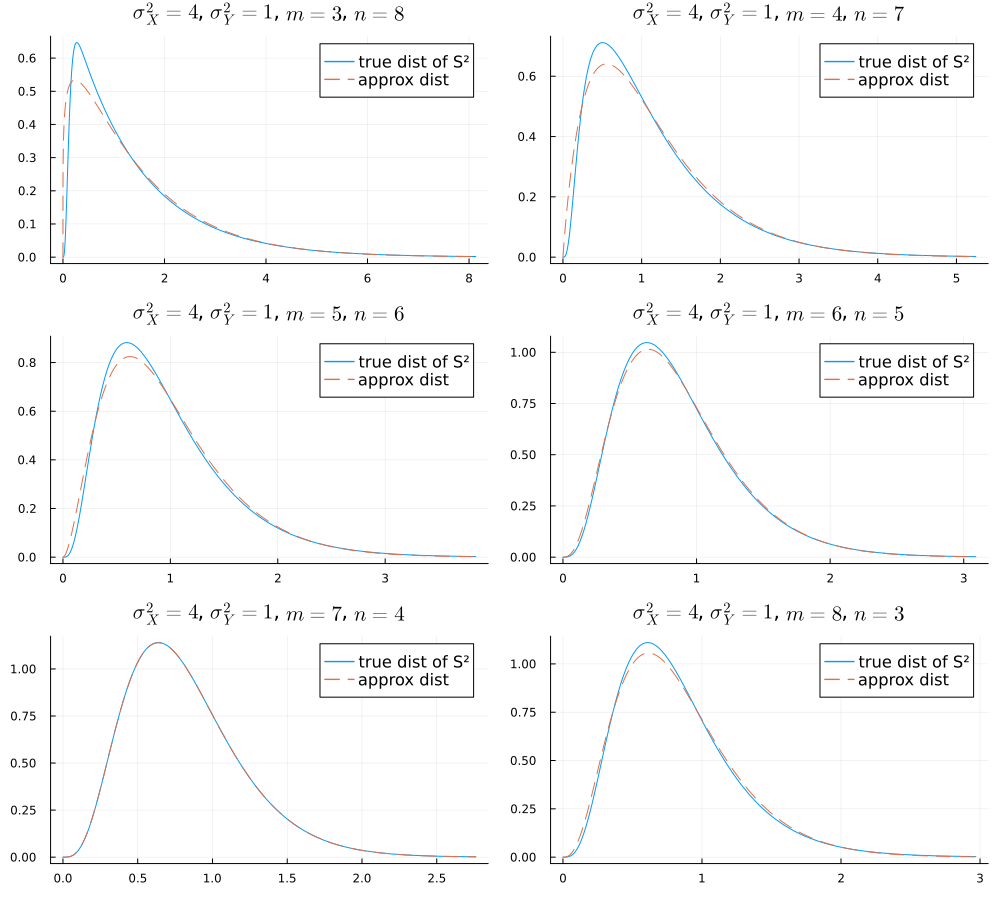

In [4]:
sx², sy² = 4, 1

PP = []
for m in 3:8
    n = 11 - m
    dist_true = dist_S²(sx², sy², m, n)
    dist_approx = approx_dist_S²(sx², sy², m, n)
    s²max = mean(dist_approx) + 5std(dist_approx)
    P = plot(dist_true, 0, s²max; label="true dist of S²")
    plot!(dist_approx, 0, s²max; label="approx dist", ls=:dash)
    title!("\$\\sigma^2_X=$sx²\$, \$\\sigma^2_Y=$sy²\$, \$m=$m\$, \$n=$n\$")
    push!(PP, P)
end

plot(PP...; size=(1000, 900), layout=(3, 2))

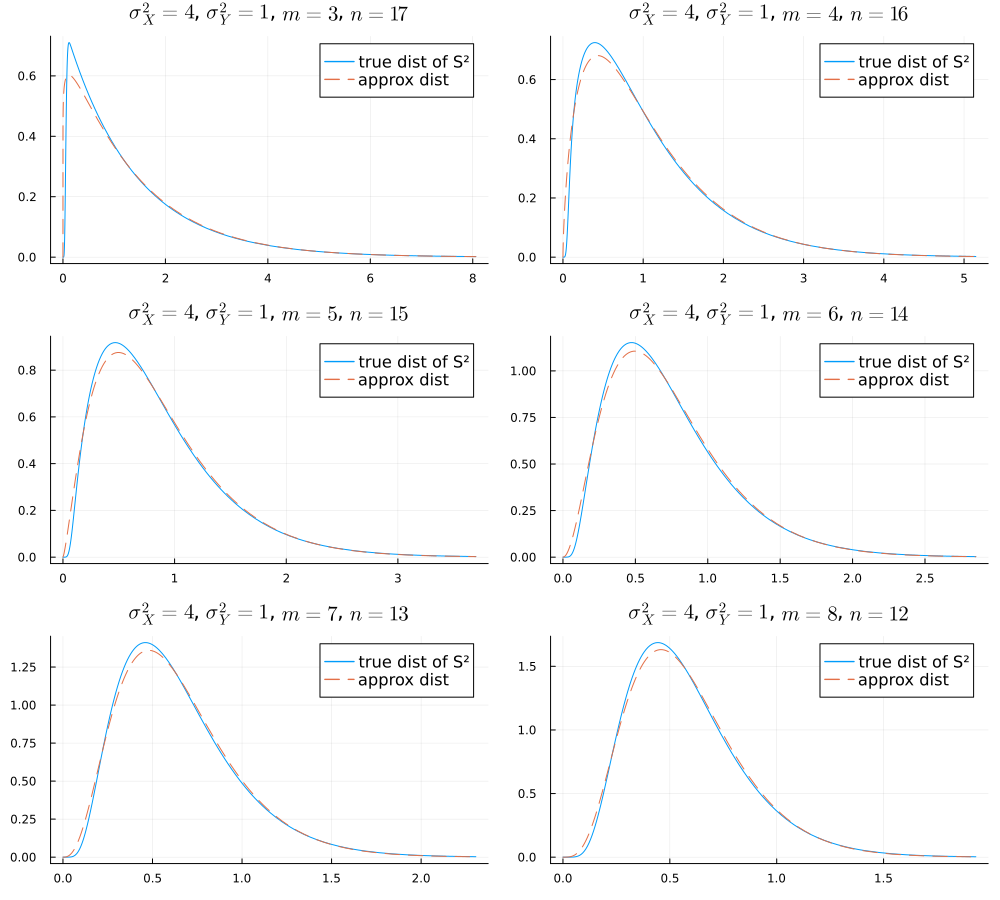

In [5]:
sx², sy² = 4, 1

PP = []
for m in 3:8
    n = 20 - m
    dist_true = dist_S²(sx², sy², m, n)
    dist_approx = approx_dist_S²(sx², sy², m, n)
    s²max = mean(dist_approx) + 5std(dist_approx)
    P = plot(dist_true, 0, s²max; label="true dist of S²")
    plot!(dist_approx, 0, s²max; label="approx dist", ls=:dash)
    title!("\$\\sigma^2_X=$sx²\$, \$\\sigma^2_Y=$sy²\$, \$m=$m\$, \$n=$n\$")
    push!(PP, P)
end

plot(PP...; size=(1000, 900), layout=(3, 2))

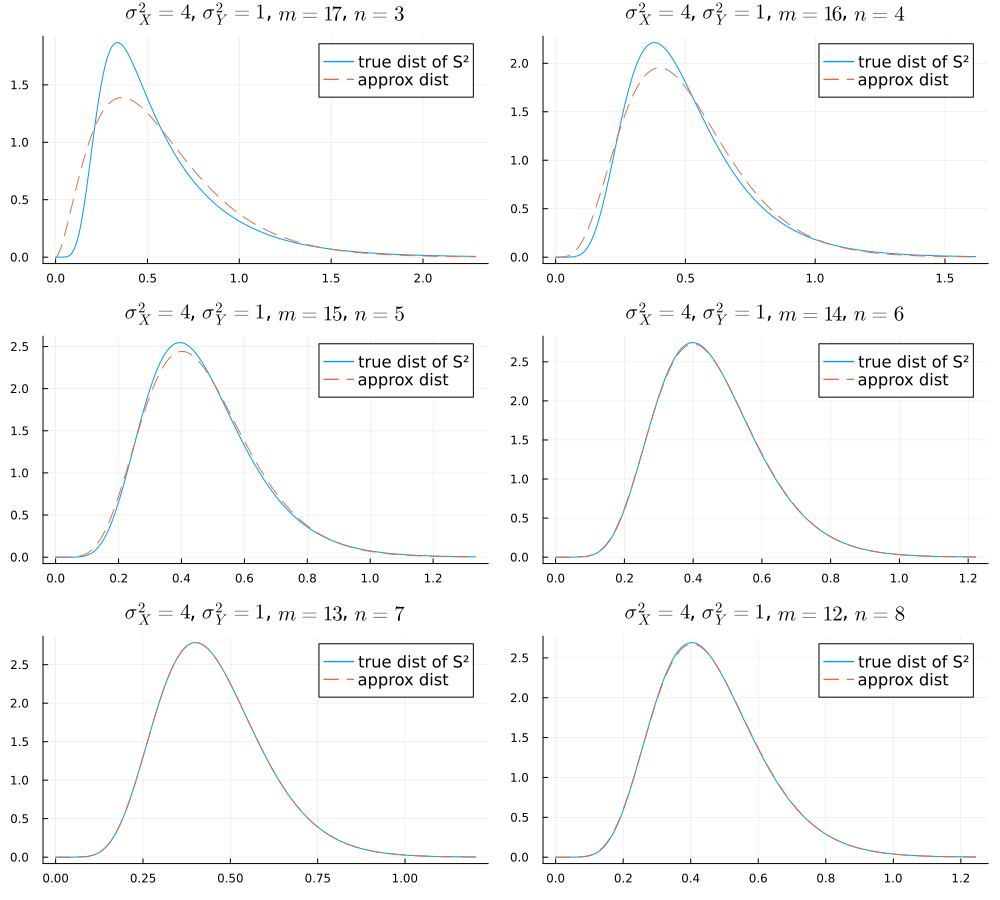

In [6]:
sx², sy² = 4, 1

PP = []
for m in 3:8
    n = 20 - m
    m, n = n, m
    dist_true = dist_S²(sx², sy², m, n)
    dist_approx = approx_dist_S²(sx², sy², m, n)
    s²max = mean(dist_approx) + 5std(dist_approx)
    P = plot(dist_true, 0, s²max; label="true dist of S²")
    plot!(dist_approx, 0, s²max; label="approx dist", ls=:dash)
    title!("\$\\sigma^2_X=$sx²\$, \$\\sigma^2_Y=$sy²\$, \$m=$m\$, \$n=$n\$")
    push!(PP, P)
end

plot(PP...; size=(1000, 900), layout=(3, 2))

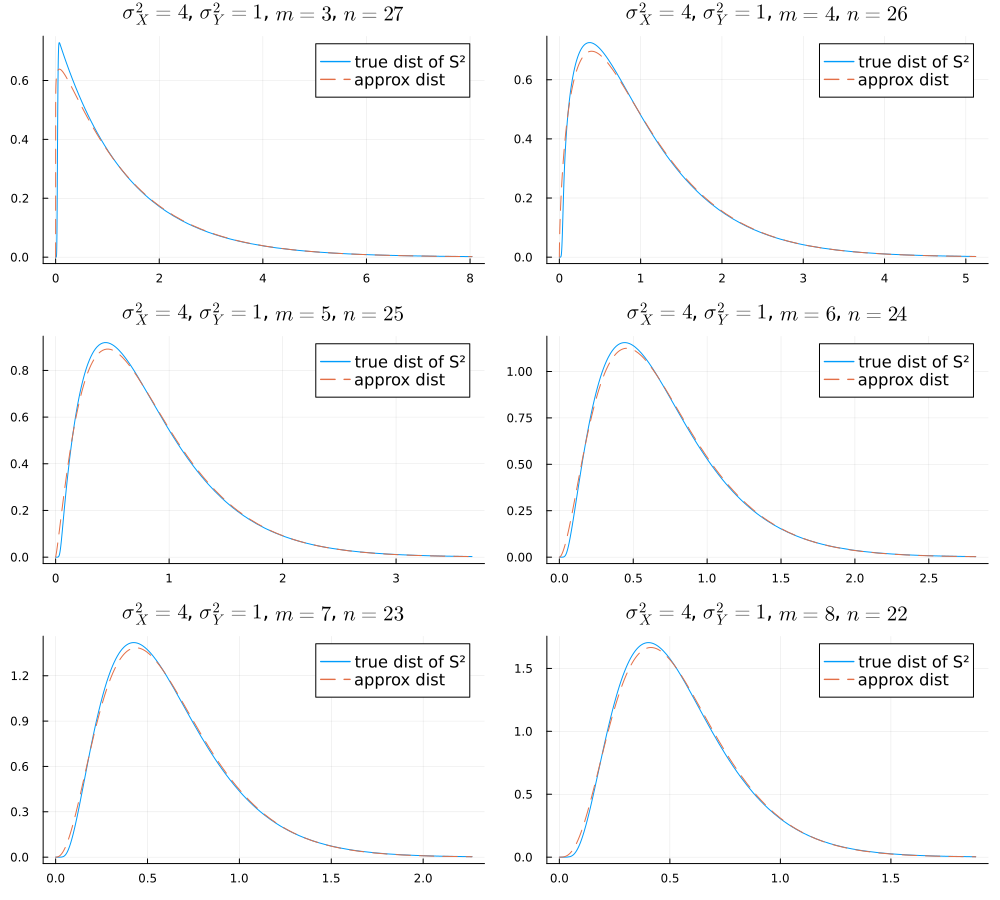

In [7]:
sx², sy² = 4, 1

PP = []
for m in 3:8
    n = 30 - m
    dist_true = dist_S²(sx², sy², m, n)
    dist_approx = approx_dist_S²(sx², sy², m, n)
    s²max = mean(dist_approx) + 5std(dist_approx)
    P = plot(dist_true, 0, s²max; label="true dist of S²")
    plot!(dist_approx, 0, s²max; label="approx dist", ls=:dash)
    title!("\$\\sigma^2_X=$sx²\$, \$\\sigma^2_Y=$sy²\$, \$m=$m\$, \$n=$n\$")
    push!(PP, P)
end

plot(PP...; size=(1000, 900), layout=(3, 2))

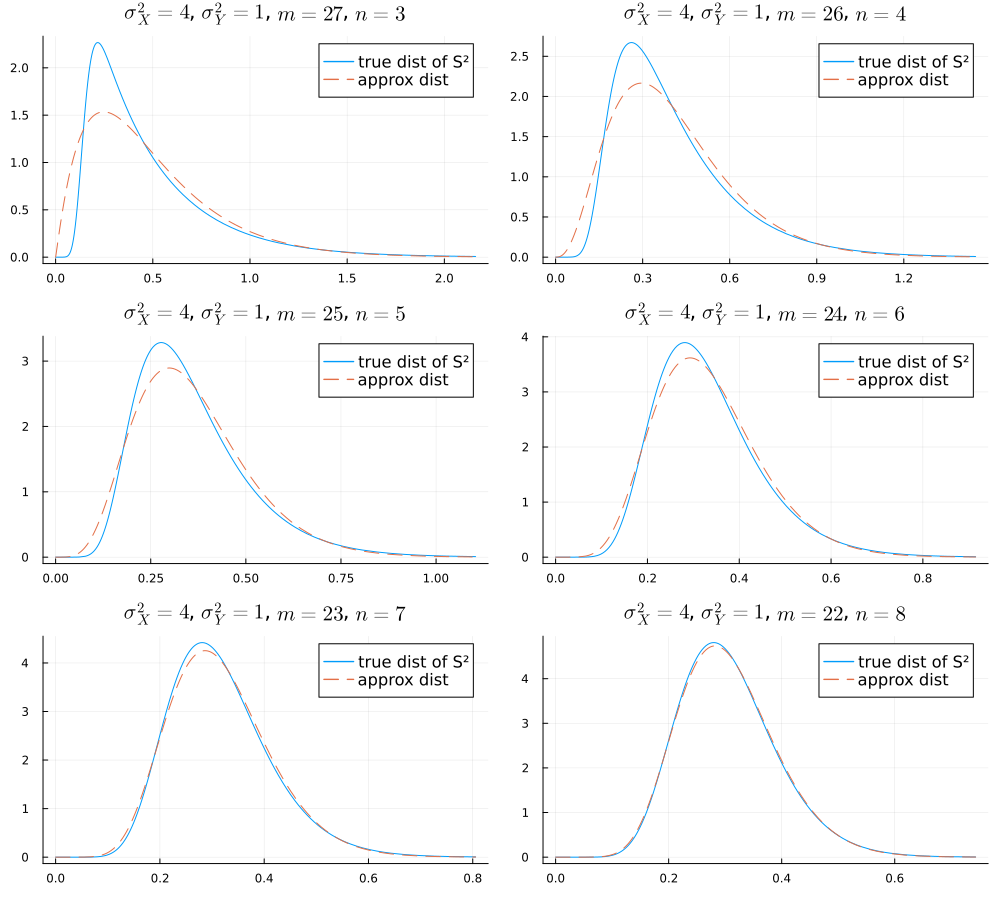

In [8]:
sx², sy² = 4, 1

PP = []
for m in 3:8
    n = 30 - m
    m, n = n, m
    dist_true = dist_S²(sx², sy², m, n)
    dist_approx = approx_dist_S²(sx², sy², m, n)
    s²max = mean(dist_approx) + 5std(dist_approx)
    P = plot(dist_true, 0, s²max; label="true dist of S²")
    plot!(dist_approx, 0, s²max; label="approx dist", ls=:dash)
    title!("\$\\sigma^2_X=$sx²\$, \$\\sigma^2_Y=$sy²\$, \$m=$m\$, \$n=$n\$")
    push!(PP, P)
end

plot(PP...; size=(1000, 900), layout=(3, 2))

## Welchのt検定で使う自由度の大きさの評価

Welchのt検定で使う自由度
\begin{align*}
\hat\nu =
\frac
{\left(\dfrac{S^2_X}{m}+\dfrac{S^2_Y}{n}\right)^2}
{\dfrac{S^4_X}{m^2(m-1)}+\dfrac{S^4_Y}{n^2(n-1)}}.
\end{align*}
は次の不等式を満たしている:
\begin{align*}
\min(m-1, n-1) \le \hat\nu \le m+n-2.
\end{align*}
数式処理を使った証明については以下を参照せよ.

$S^2_X=u>0$, $S^2_Y=v>0$, $\min(m-1, n-1)>0$とすると,

In [9]:
@syms u v m n
(; a, nu, ES², halfvarS²) = a_nu_welch(u, v, m, n)
nu |> display
factor(halfvarS²*((m+n-2)-nu))

               2       
        /v   u\        
        |- + -|        
        \n   m/        
-----------------------
     2            2    
    v            u     
---------- + ----------
 2            2        
n *(n - 1)   m *(m - 1)

                           2
/   2            2        \ 
\- m *v + m*v + n *u - n*u/ 
----------------------------
    2  2                    
   m *n *(m - 1)*(n - 1)    

これより, $\hat\nu \le m+n-2$だと分かる.

In [10]:
factor(halfvarS²*(nu-(m-1))) |> display
numerator(factor(halfvarS²*(nu-(m-1))))/v

  /   2                2          \
v*\- m *v + m*n*v + 2*n *u - 2*n*u/
-----------------------------------
               2                   
            m*n *(n - 1)           

   2                2          
- m *v + m*n*v + 2*n *u - 2*n*u

$n\le m$のとき, $-m^2v+mnv+2n^2u-2nu = mv(n-m) + 2un(n-1) \ge 0$なので, $\hat\nu\ge m-1$となる.

これより, $\hat\nu\ge \min(m-1, n-1)$だと分かる.

## 非正規母集団でのWelchのt検定の様子

この節では, $X_i,Y_j$の従う分布が正規分布とは限らないと仮定する.

標本平均に関する中心極限定理より, 母集団無能ごとに標本サイズ$m,n$を十分に大きくすると, $\Delta\mu = \mu_X - \mu_Y$とおいたときの
\begin{align*}
Z = \frac{\bar X-\bar Y-\Delta\mu}{\sqrt{\dfrac{\sigma^2_X}{m}+\dfrac{\sigma^2_Y}{n}}}
\end{align*}
が従う分布は標準正規分布で近似される.

標本サイズ$m,n$が十分に大きいならば, 不偏分散$S^2_X, S^2_Y$は母分散$\sigma^2_X, \sigma^2_Y$を近似するので, $Z$は
\begin{align*}
T = \frac{\bar X-\bar Y-\Delta\mu}{\sqrt{\dfrac{S^2_X}{m}+\dfrac{S^2_Y}{n}}}
\end{align*}
で近似される.

このことから, 標本サイズ$m,n$が十分に大きい場合には, Welchのt検定におけるt分布を標準正規分布で置き換えた検定法を使用できることが分かる.

さらに, Welchのt検定で使う自由度は$\min(m-1, n-1)$以上になるので, Welchのt検定で使う自由度は標本サイズ$m,n$を大きくすると大きくなり, 自由度が大きなt分布は標準正規分布で近似されることから, 標本サイズ$m,n$が十分に大きいならば, t分布を使った通常のWelchのt検定の結果と, Welchのt検定で使うt分布を標準正規分布で置き換えることによって得られた検定の結果は近似的に等しくなる.

これで, 母集団分布に応じて標本サイズ$m,n$が十分大きくすれば, 非正規母集団の場合であってもWelchのt検定を使えることが分かった.

自由度$\nu=5,10,20,30$のt分布と標準正規分布の密度関数の同時プロットが次のセルにある.

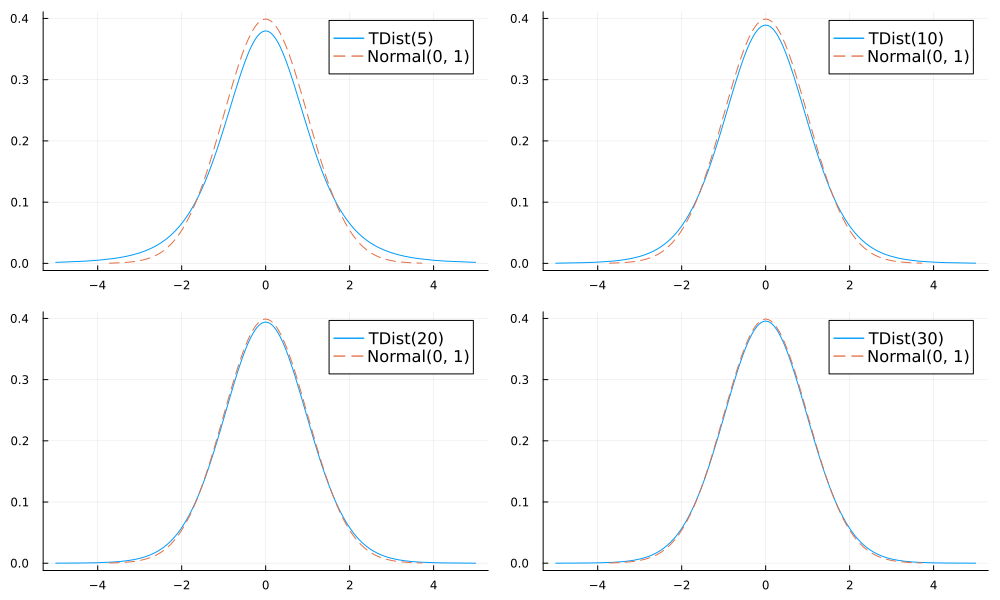

In [11]:
PP = []
for nu in (5, 10, 20, 30)
    P = plot(TDist(nu), -5, 5; label="TDist($nu)")
    plot!(Normal(0, 1); label="Normal(0, 1)", ls=:dash)
    push!(PP, P)
end
plot(PP...; size=(1000, 600))

## 補足: 非正規母集団の標本の不偏分散が従う分布について

$X_i$が正規分布に従うならば, 不偏分散$S^2_X$について
$$
\frac{(m-1)S^2_X}{\sigma^2_X} \sim \chi^2(m-1)
$$
すなわち
$$
S^2_X \sim \sigma^2_X \frac{\chi^2(m-1)}{m-1}
$$
が成立しており, 特に
$$
\var(S^2_X) = \sigma^4_X \frac{2}{m-1}.
$$

しかし, 正規性を仮定しない一般の場合には
$$
\var(S^2_X) = \sigma^4_X \left(\frac{\bar\kappa_{4,X}}{m}+\frac{2}{m-1}\right).
$$
ここで$\bar\kappa_{4,X}$は$X_i$の(過剰)尖度であった.

ゆえに, $X_i$が従う分布が非正規分布で尖度がゼロでないときの不偏分散$S^2_X$が従う分布の分散は, $X_i$が従う分布が正規分布のときの$S^2_X$が従う分布の分散と異なる値になり, 特に$X_i$が従う分布が非正規分布で尖度がゼロでないときの$\dfrac{(m-1)S^2_X}{\sigma^2_X}$が従う分布は自由度$m-1$の$\chi^2$分布で近似されなくなる.

このことから, 母集団分布が正規分布で近似されている保証がない場合には(保証される場合はほぼない), $\dfrac{(m-1)S^2_X}{\sigma^2_X}$が従う分布が自由度$m-1$の$\chi^2$分布になることを使う検定法は使用しない方がよいことが分かる. 例えば, 1標本での母分散に関する$\chi^2$検定や2標本での母分散の比に関するF検定は使わない方がよい.

## Studentのt検定とWelchのt検定のαエラー率の比較

### 不等分散の正規母集団での比較

不等標本サイズの場合にStudentのt検定は不等分散に対して脆弱である.

等標本サイズの場合には, Studentのt検定の結果はWelchのt検定に近くなる.

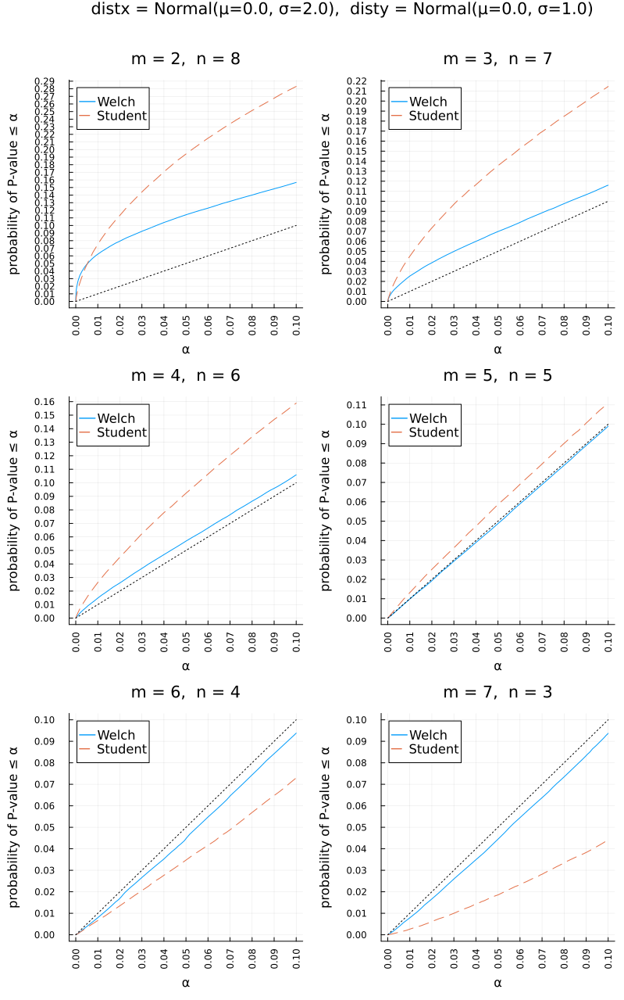

In [12]:
plot_pvals(; distx=Normal(0, 2), disty=Normal(0, 1), niters=10^5, k=1)

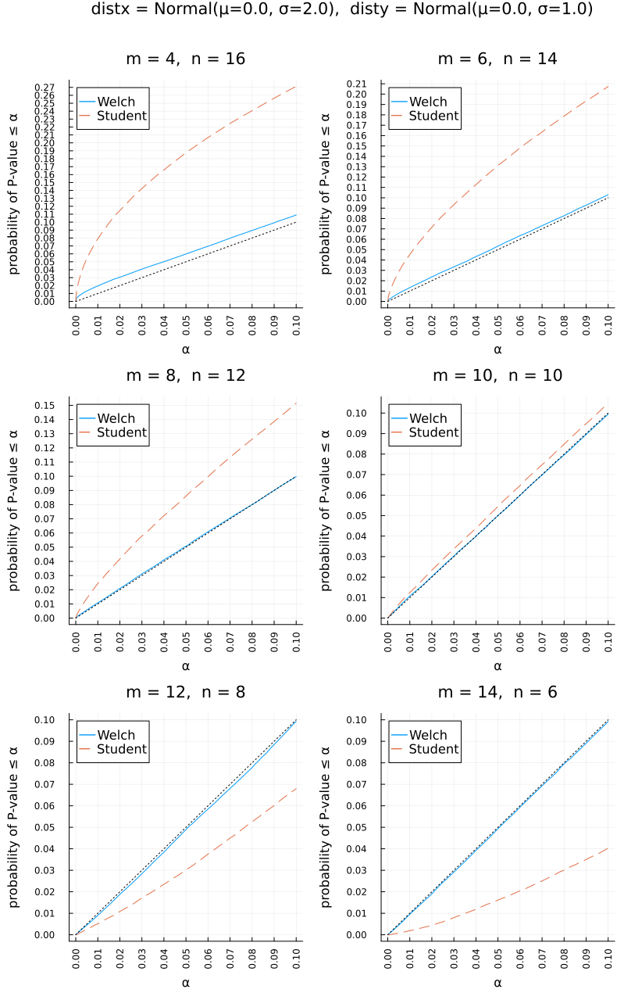

In [13]:
plot_pvals(; distx=Normal(0, 2), disty=Normal(0, 1), niters=10^5, k=2)

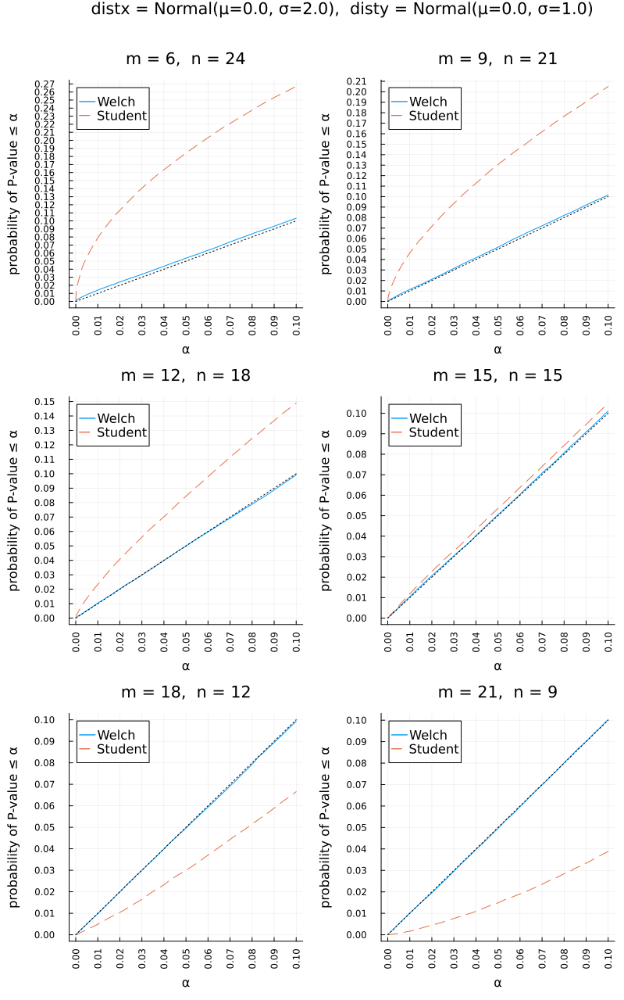

In [14]:
plot_pvals(; distx=Normal(0, 2), disty=Normal(0, 1), niters=10^5, k=3)

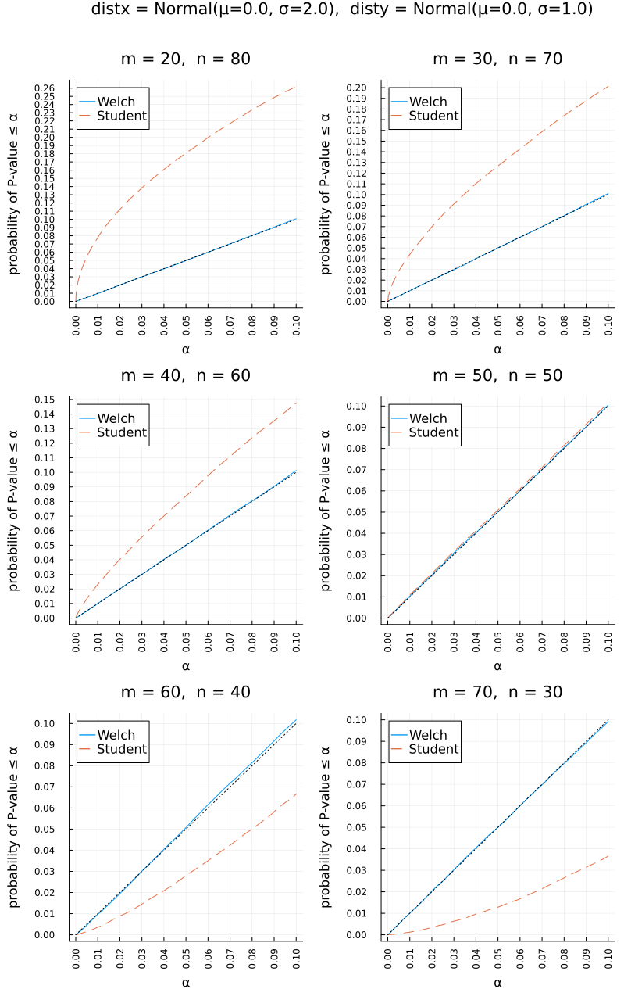

In [15]:
plot_pvals(; distx=Normal(0, 2), disty=Normal(0, 1), niters=10^5, k=10)

### 非正規母集団での比較

mean(distx) = 1.25
mean(disty) = 1.25
var(distx) = 1.25
var(disty) = 0.3125


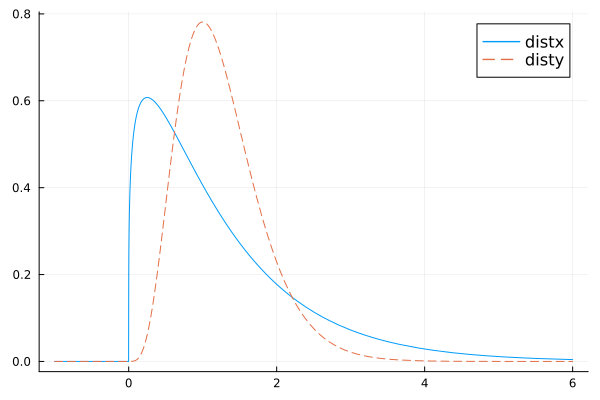

In [16]:
distx = Gamma(5/4, 1)
disty = Gamma(5, 1/4)
@show mean(distx) mean(disty)
@show var(distx) var(disty)
plot(distx, -1, 6; label="distx")
plot!(disty, -1, 6; label="disty", ls=:dash)

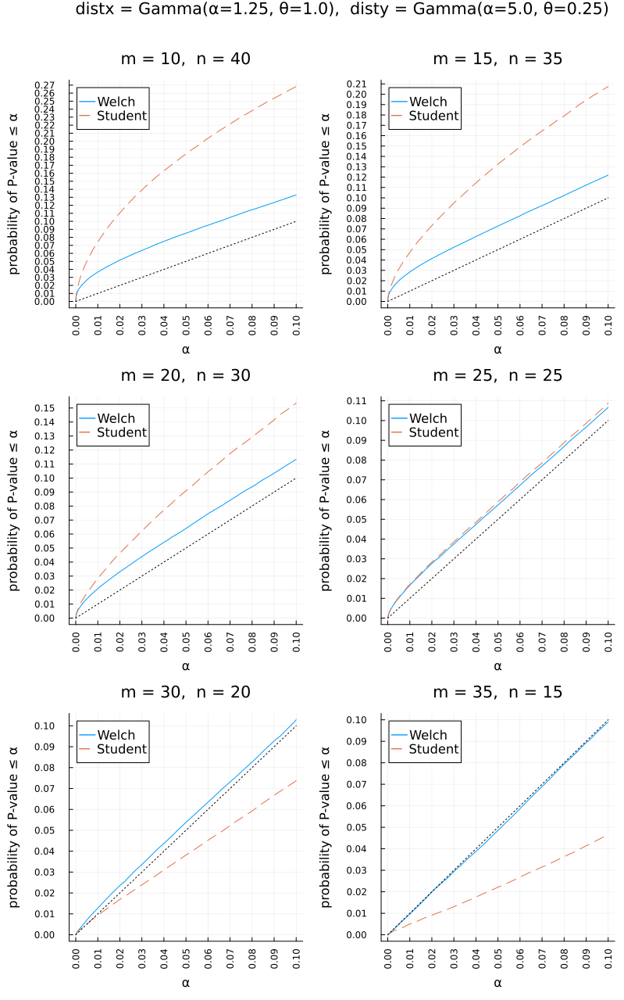

In [17]:
plot_pvals(; distx, disty, niters=10^5, k=5)

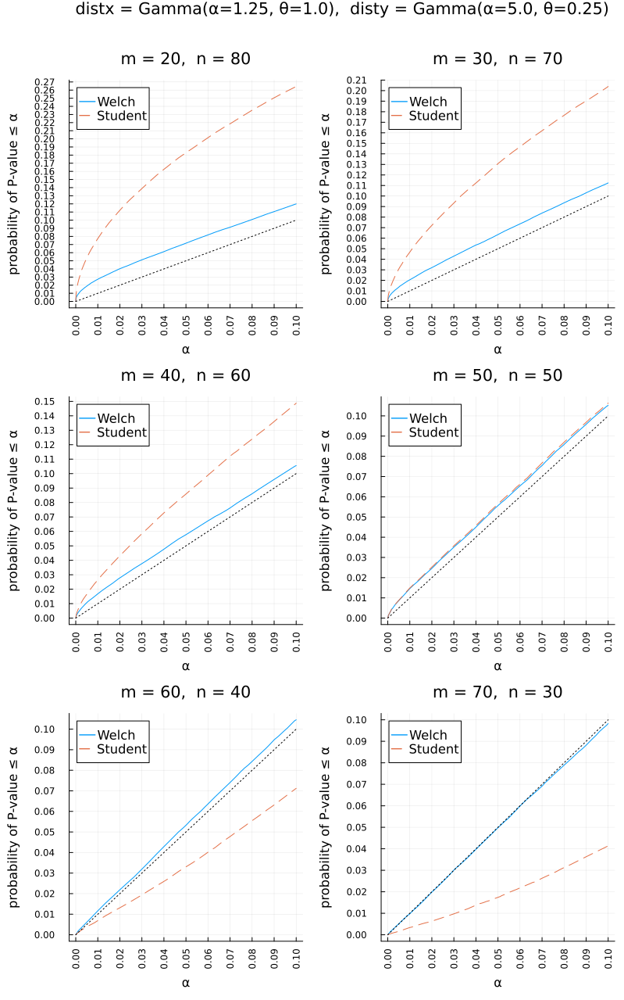

In [18]:
plot_pvals(; distx, disty, niters=10^5, k=10)

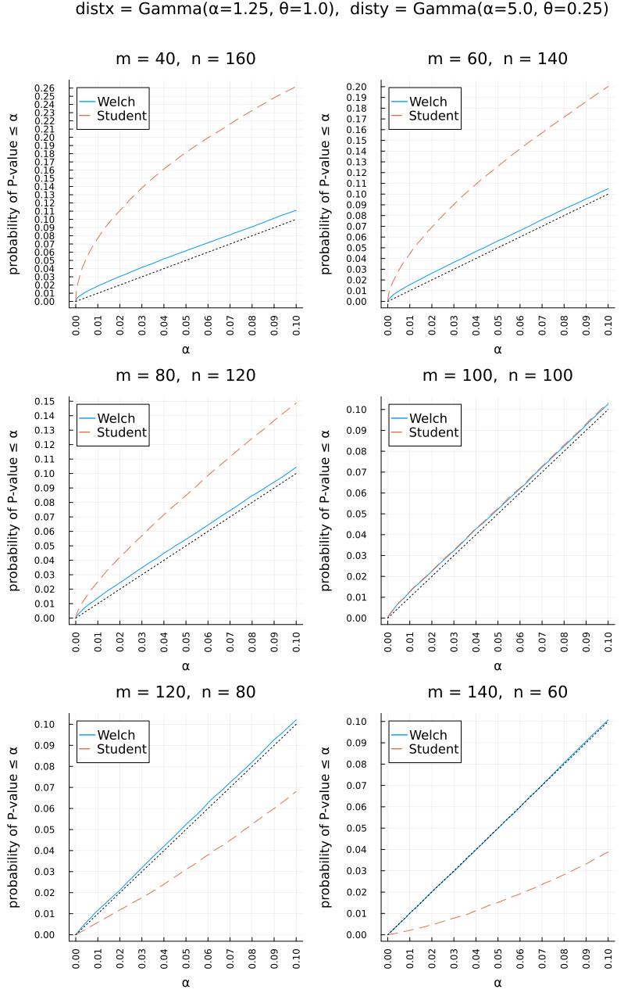

In [19]:
plot_pvals(; distx, disty, niters=10^5, k=20)

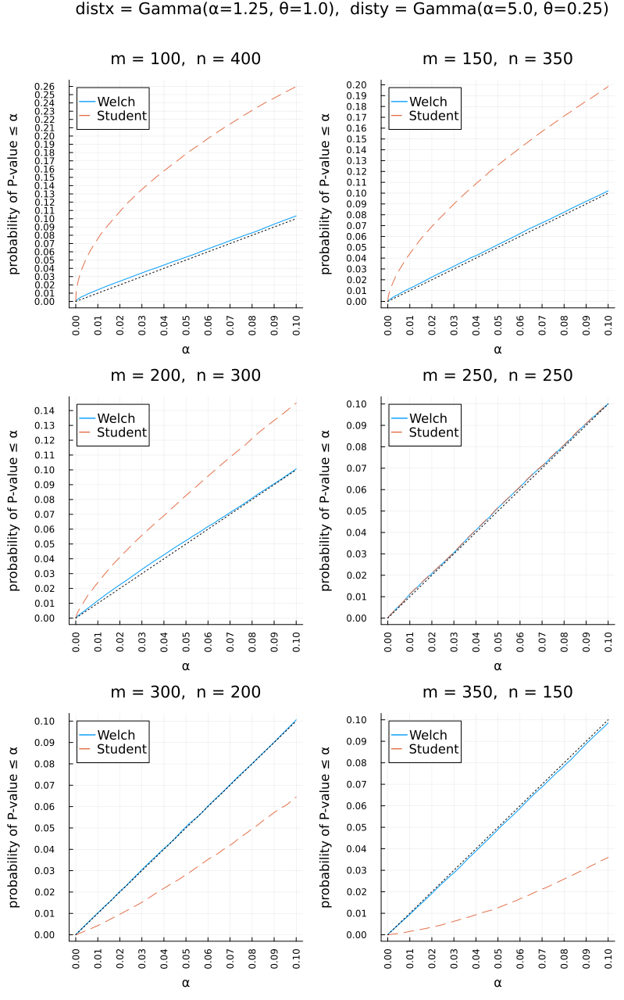

In [20]:
plot_pvals(; distx, disty, niters=10^5, k=50)